# Chapter 5: Define cellular states and make Onco-GPS map

<br>
<div>
    <img src="../media/method_chap4.png" width=2144 height=1041>
</div>

### Analysis overview
Now that we have defined and annotated the 9 KRAS transcriptional components in chapter 3, we will analize their behavior across KRAS mutant cell line samples. 

We will find that in those samples the components clustered into three major groups:

* ERBB3/PI3K – WNT/KRAS Core – AP1 (C1-C3-C9), 
* E2F – MAPK – EMT – MYC (C2-C4-C6-C8) and,
* PAX8/HNF1B – NF-κB (C5-C7).

This suggest that in KRAS mutant cancers the patterns of pathway co-activation, as represented by the components, reflect specific synergies and patterns of cooperation among these pathways. We will use those 3 representative components (C1, C2 and C7), that summarize the transcriptional behavior of the KRAS oncogenic signature genes, to cluster the KRAS mutant samples in the reference dataset using Hierarchical Consensus Clustering ([Monti et al. 2003](http://link.springer.com/article/10.1023/A:1023949509487)) with the Information Coefficient (IC) as similarity metric. This will result in 4 clusters representing cellular states: S1–S4. 

The detailed procedure is as follows:

### Defining Onco-GPS states

*	 Standardize the rows of the  matrix. The standardized values above/below a threshold (3.25/-3.25) are set to that threshold to avoid extreme values. 
*	 Rescale the standardized-thresholded rows of the  matrix to the interval [0, 1]. 
*	 Implement a consensus clustering procedure by bootstrap re-sampling of the columns of the  matrix and by clustering them using hierarchical clustering (Ward agglomeration method, R function hclust) (Hartigan 1975). The pairwise distance between columns of the $H$-matrix is computed using one minus the Information Coefficient (IC).
*	 Repeat the re-sampling 50 times for number-of-clusters/states values between a minimum and maximum and generate a membership matrix for each of the number-of-clusters values.
*	 Compute the cophenetic coefficient of the membership matrices and use it to choose an optimal value  for the number of clusters/states ([Monti et al. 2003](http://link.springer.com/article/10.1023/A:1023949509487))
*	  Generate a final consensus clustering membership table for each of the number-of-clusters values.
*	 Train a multi-class support vector machine (SVM) classifier using as inputs the component amplitudes to predict each of the states (clusters).  This classifier will be useful to assign states to samples from independent test datasets.

To facilitate the visualization and integrated analysis of components, samples and cellular states, we used a novel visualization/analysis paradigm that we call Onco-GPS map. In this map, the transcriptional components are represented by nodes connected by straight lines. In general, the location of these nodes on the map derive from a projection algorithm (Sammon map) that makes the two-dimensional geometric distances between nodes approximate the “informational” distances between the components across the samples (e.g. KRAS mutants) in the reference dataset. In the case of only 3 nodes, as the one we are exemplifying in this notebook, the locations are set to be the nodes of an equilateral triangle (Gibbs or ternary diagram). For an example of the more general case see e.g. notebook 8. 

Once the location of the component nodes is determined, the location of an individual sample can be found by calculating a vectorial sum of the components’ locations weighted by their component amplitudes for that sample. The detailed procedure is as follows:

1.-  **Generating the Onco-GPS layout**. 
* Compute the location of the component nodes by performing a Sammon map projection of the $H$-matrix informational distances from $k_{c}$ to 2-dimensions.  In case of 3 components these can be assigned to the vertices of an equilateral triangle.
*	Plot a black circle symbol and a text label to name the component node.
*	Plot straight lines connecting the component nodes. 
    
2.-  **Projecting samples onto of the Onco-GPS layout**.
* Compute the location for each sample as a vectorial sum of the components’ locations $(C^{j}_{x}, C^{j}_{y})$ weighted by the normalized component amplitudes raised to an exponent $\alpha$

<div>
     <img src="../media/chap5_equation.png" width=450 height=10>
</div>

* This is analogous to calculating the equilibrium location of a mass being pulled by multiple strings, using a physical analogy, or the location of an object by estimating its proximity to a set of reference satellites, using a geographical GPS analogy. In this way, samples with relative high amplitude of a given component, with respect to the rest, will be projected near the location of that dominant component’s node.  
    
    
3.-  **Generating background: contour lines and state-membership colors**.
    The states can be represented using background contour lines and colors in such way that a “region” of the map corresponds to samples sharing the same cellular state membership. The contour represent probabilities of membership to the corresponding state as provided by the state-specific SVM classifiers described above.
    
### 1. Set up notebook and import [CCAL](https://github.com/KwatME/ccal)

In [9]:
from notebook_environment import *
import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython

%load_ext autoreload
%autoreload 2
%matplotlib inline

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### 2. Read in H Matrix Produced by NMF of the matrix of the CRISPR IO Down gene list vs. B9991003 Sample

In [2]:
h_matrix = pd.read_table('../output/nmfccs_clinical_down/nmf_k3_h.txt', index_col=0)
h_matrix.to_csv('../output/down_h_matrix.txt', sep='\t')
h_matrix

,B9991003 X00936b9285d6b8665ae9122993fb8e91,B9991003 X105622fadc33f23755ac2df823110aca,B9991003 Xe44f39747a8e84b02b4cb24659312144,B9991003 X293dd1284496215e9a0eca9f17a98e7e,B9991003 X01ed7190ce00862696edbf047b542045,B9991003 Xf4a6a5a1450a8448882e1c0aebc0eea5,B9991003 Xf7ee4a331a8fd70edc240dff978c170d,B9991003 Xcddbd4d01bc7513298a5135e97cfdb6b,B9991003 Xa57451efa2822becb256706fe939d078,B9991003 Xff8fbe2fe76c82d429d4fa1d315f3b93,...,B9991003 Xa7d2bd80340b4019986ea8d8c3638c75,B9991003 Xbc7a029dc7ce4b19a5a2b78a7b2fc6ae,B9991003 X13b911b56a330efd2660b67b1cf98466,B9991003 X9388bd484d0e404c6732573b4228d2a2,B9991003 Xc3d410d70dd7359baa40126494fb6765,B9991003 X50772aa64efb859960b20f8801cd6f58,B9991003 X91bcd3067a1a7954692d836515e04869,B9991003 Xc7439a06ffa32b313b0ec1b987b992a2,B9991003 X21a6043653d187f8bbead475d2f49791,B9991003 Xa021f5de25a2ffa059870f059a65d075
C0,2499.787299,2652.830610,1637.577788,2017.510673,2219.126348,5349.329169,1481.646577,4815.490367,3167.514677,1722.053932,...,1402.866154,4402.072955,1563.734293,4883.021848,1136.701867,1598.008252,3764.204621,4060.583428,3450.071145,2574.837872
C1,4098.829834,4852.024196,4560.889676,4405.227763,4882.843753,2825.656370,5365.337792,1298.223274,4134.293931,4262.065423,...,4692.629238,1483.013627,4900.493127,4775.140429,6476.971341,6459.635794,3461.004828,2756.120733,4480.602334,3125.451709
C2,3313.823887,2279.465992,3609.227146,3422.690725,2665.075290,2039.034680,2815.136460,4354.014732,2622.664897,3878.377028,...,3682.638609,4538.874758,3281.792955,200.658812,1843.744288,1415.435166,2833.853073,3374.283945,1940.695409,4385.187359


### 3. Plot B9991003 H Matrix

No handles with labels found to put in legend.
No handles with labels found to put in legend.


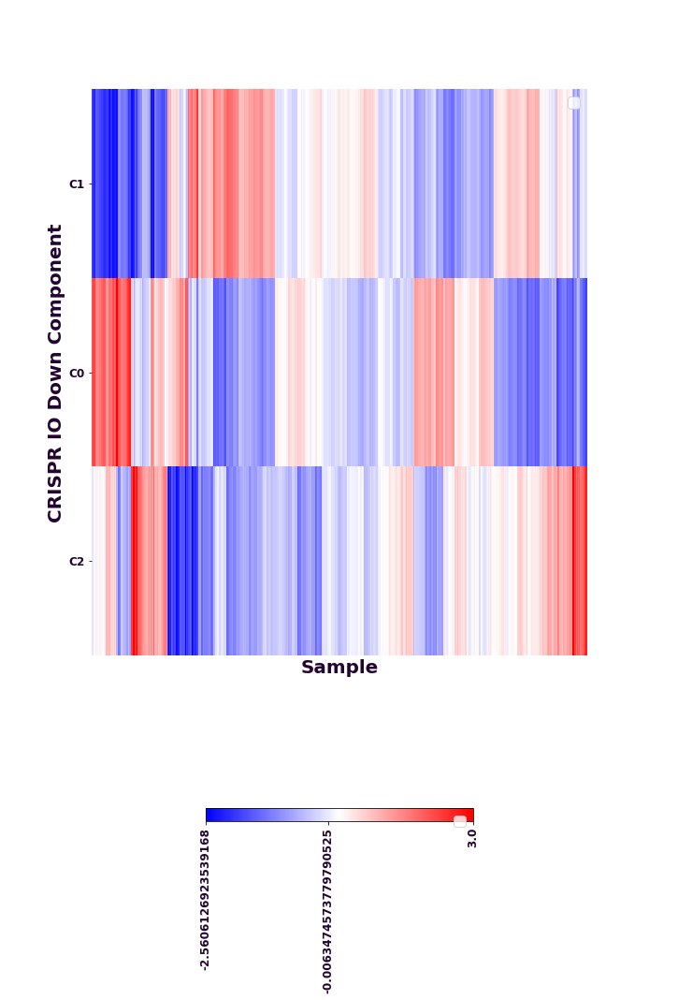

In [3]:
ccal.plot_heatmap(
    h_matrix,
    normalization_method='-0-',
    normalization_axis=1,
    cluster=True,
    xlabel='Sample',
    ylabel='CRISPR IO Down Component',
    xticklabels=False)

### 4. Compare the CRISPR IO Down components to each other

Applying <function compute_information_coefficient at 0x7f88945e3040> ...
	1/3 ...
	3/3 - done.


No handles with labels found to put in legend.


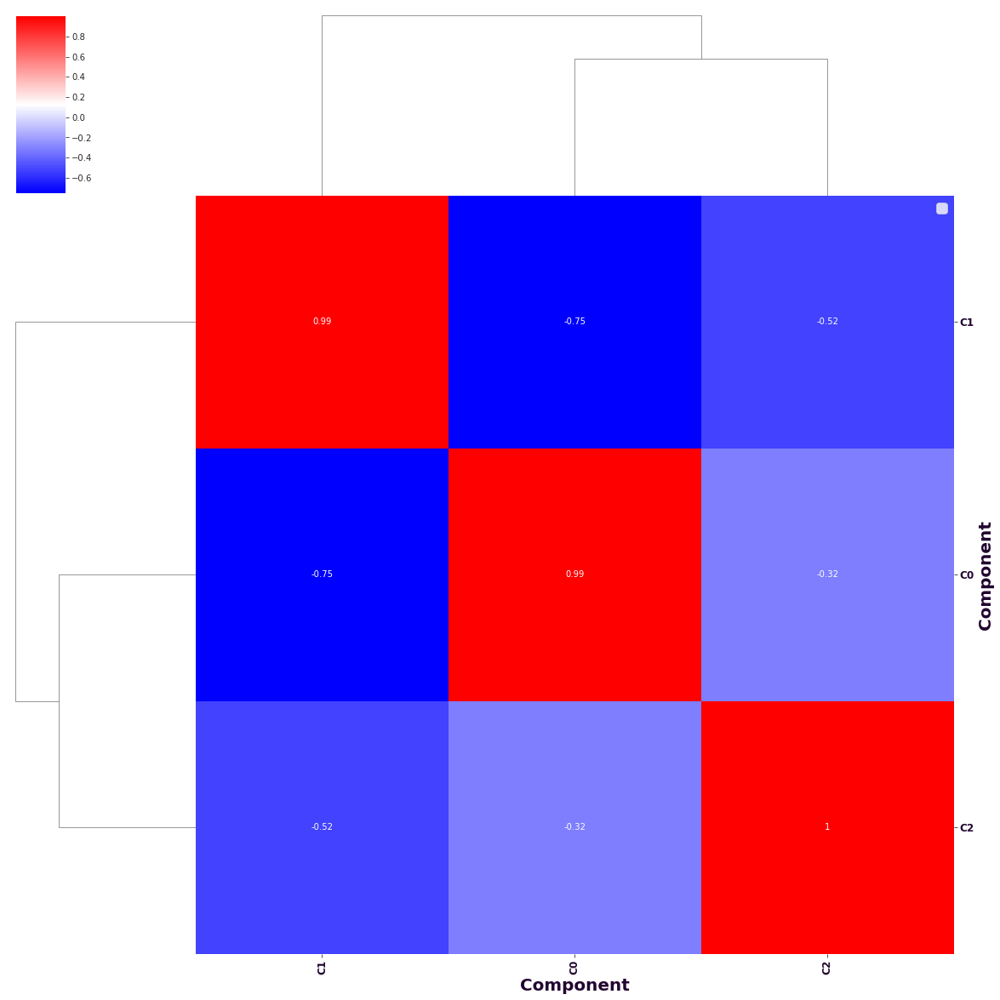

,C0,C1,C2
C0,0.994145,-0.749991,-0.318927
C1,-0.749991,0.994529,-0.524711
C2,-0.318927,-0.524711,0.996973


In [10]:
ccal.make_comparison_panel(
    h_matrix,
    h_matrix,
    axis=1,
    array_2d_0_name='Component',
    array_2d_1_name='Component')

### 6. Cluster CRISPR IO Down H matrix to define oncogenic states

Computing distances with <function compute_information_distance at 0x7f888f94a820> ...
Applying <function compute_information_distance at 0x7f888f94a820> ...
	1/726 ...
	11/726 ...
	21/726 ...
	31/726 ...
	41/726 ...
	51/726 ...
	61/726 ...
	71/726 ...
	81/726 ...
	91/726 ...
	101/726 ...
	111/726 ...
	121/726 ...
	131/726 ...
	141/726 ...
	151/726 ...
	161/726 ...
	171/726 ...
	181/726 ...
	191/726 ...
	201/726 ...
	211/726 ...
	221/726 ...
	231/726 ...
	241/726 ...
	251/726 ...
	261/726 ...
	271/726 ...
	281/726 ...
	291/726 ...
	301/726 ...
	311/726 ...
	321/726 ...
	331/726 ...
	341/726 ...
	351/726 ...
	361/726 ...
	371/726 ...
	381/726 ...
	391/726 ...
	401/726 ...
	411/726 ...
	421/726 ...
	431/726 ...
	441/726 ...
	451/726 ...
	461/726 ...
	471/726 ...
	481/726 ...
	491/726 ...
	501/726 ...
	511/726 ...
	521/726 ...
	531/726 ...
	541/726 ...
	551/726 ...
	561/726 ...
	571/726 ...
	581/726 ...
	591/726 ...
	601/726 ...
	611/726 ...
	621/726 ...
	631/726 ...
	641/726 ...
	651/726

No handles with labels found to put in legend.


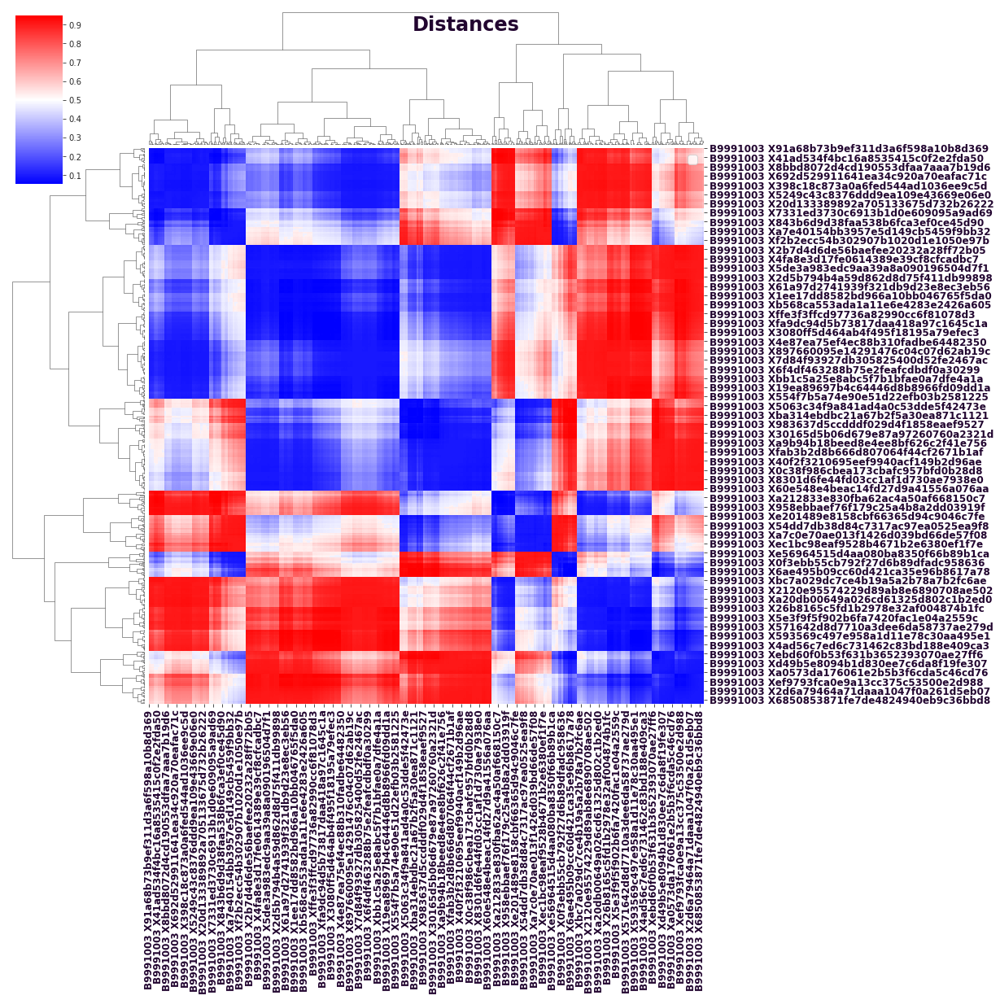

HCC with K = 2 ...
	K = 2: 1/50 ...
	K = 2: 11/50 ...
	K = 2: 21/50 ...
	K = 2: 31/50 ...
	K = 2: 41/50 ...
	K = 2: 50/50 - done.


No handles with labels found to put in legend.
No handles with labels found to put in legend.


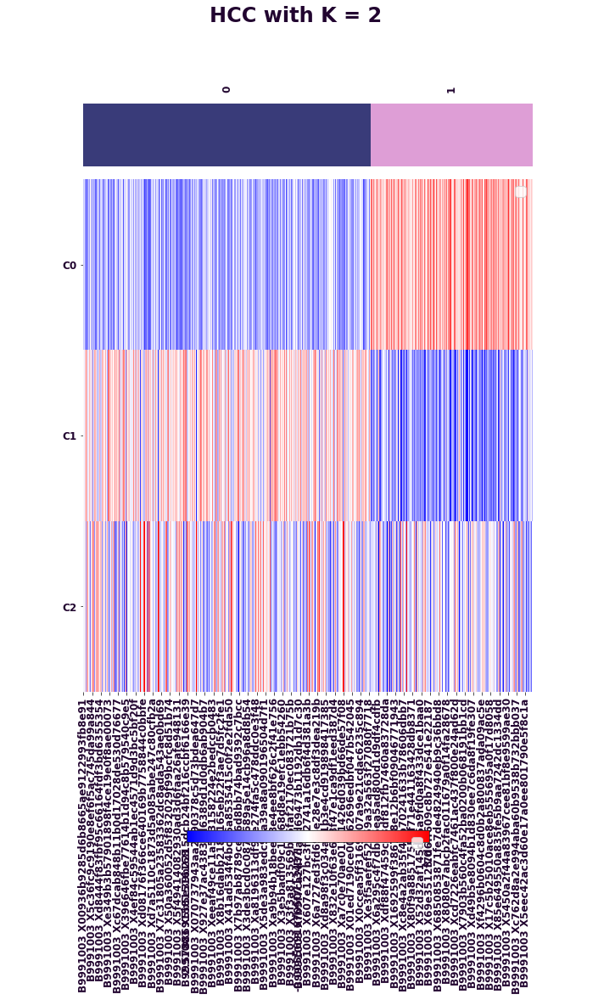

No handles with labels found to put in legend.
No handles with labels found to put in legend.


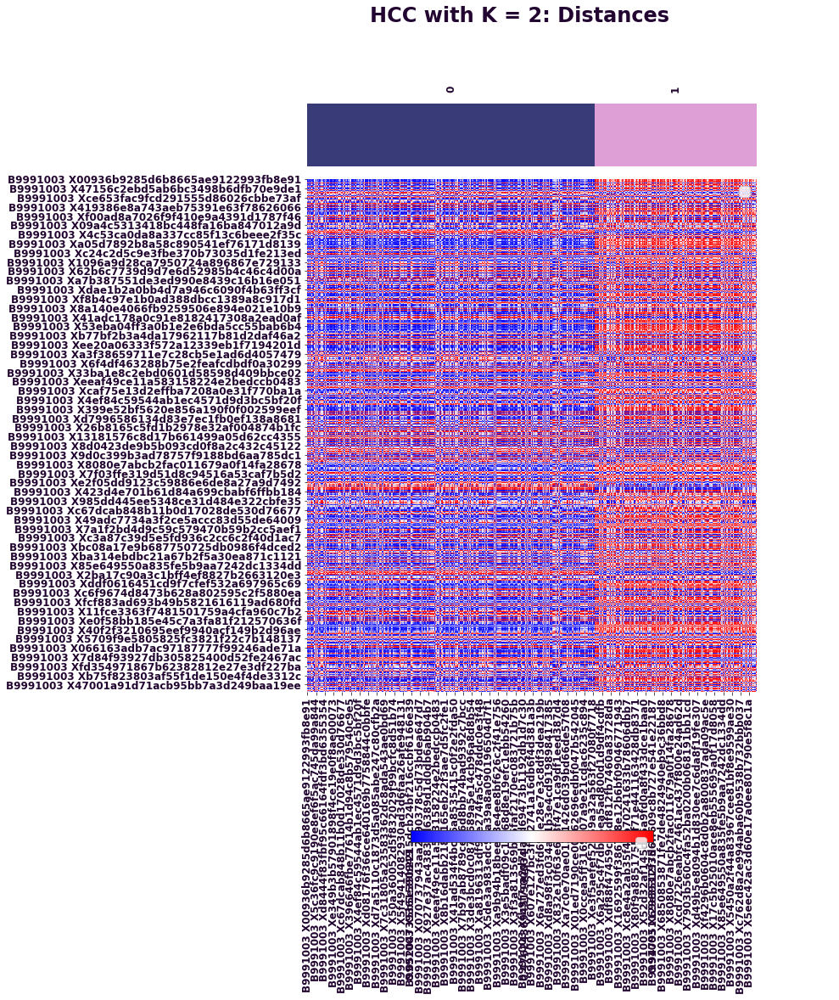

HCC with K = 3 ...
	K = 3: 1/50 ...
	K = 3: 11/50 ...
	K = 3: 21/50 ...
	K = 3: 31/50 ...
	K = 3: 41/50 ...
	K = 3: 50/50 - done.


No handles with labels found to put in legend.
No handles with labels found to put in legend.


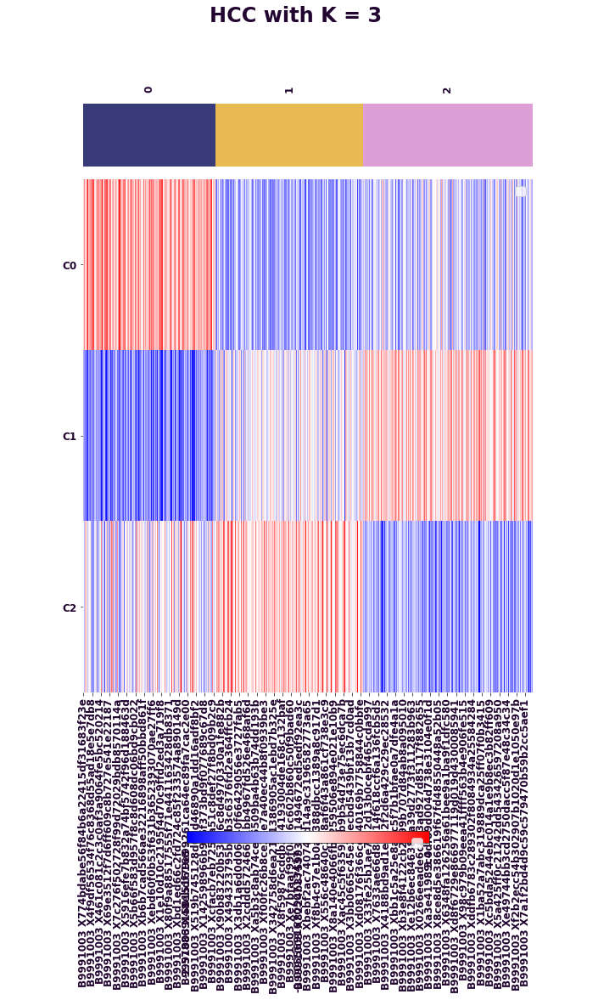

No handles with labels found to put in legend.
No handles with labels found to put in legend.


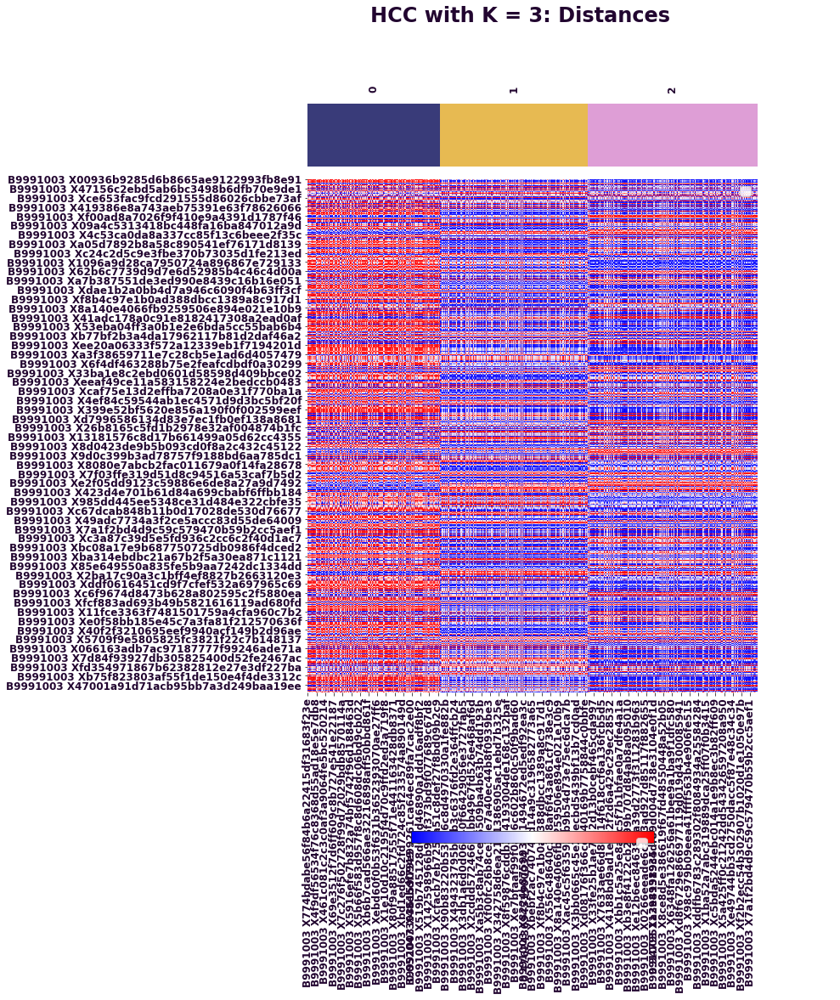

HCC with K = 4 ...
	K = 4: 1/50 ...
	K = 4: 11/50 ...
	K = 4: 21/50 ...
	K = 4: 31/50 ...
	K = 4: 41/50 ...
	K = 4: 50/50 - done.


No handles with labels found to put in legend.
No handles with labels found to put in legend.


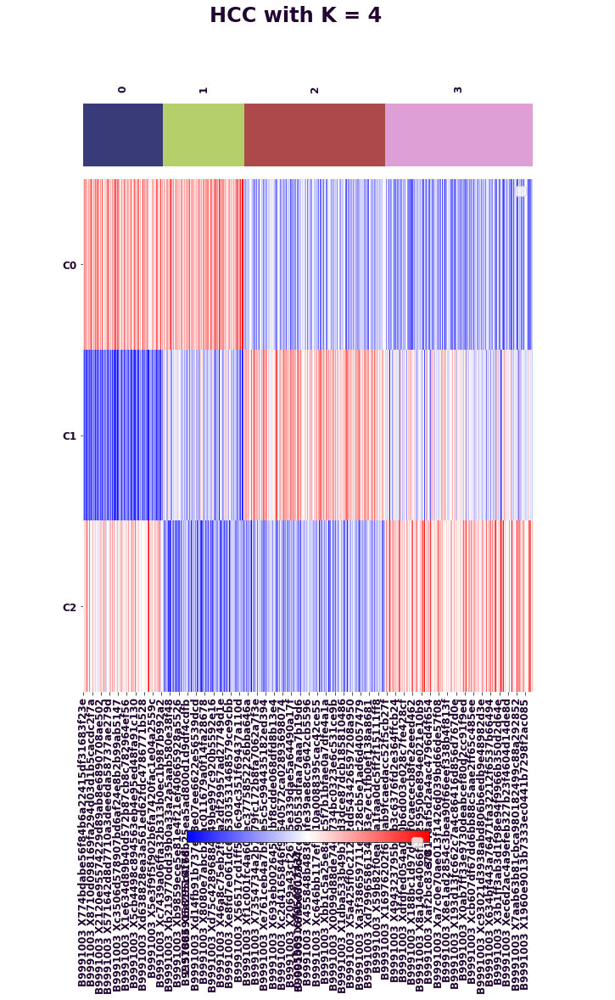

No handles with labels found to put in legend.
No handles with labels found to put in legend.


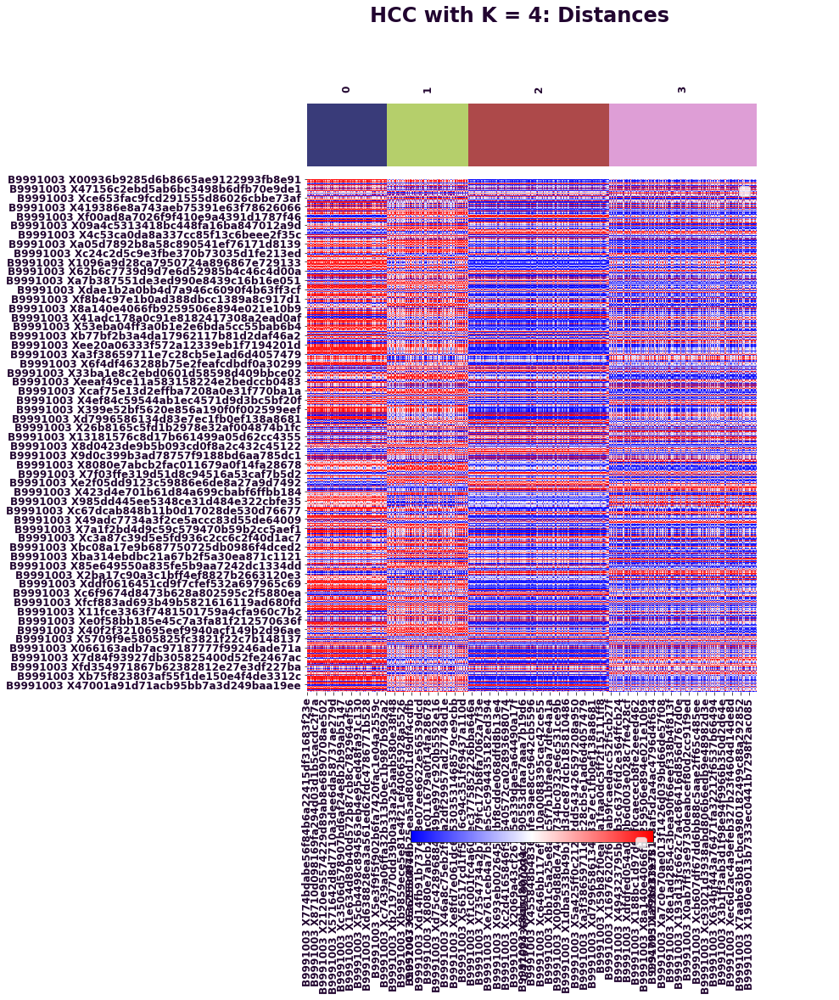

HCC with K = 5 ...
	K = 5: 1/50 ...
	K = 5: 11/50 ...
	K = 5: 21/50 ...
	K = 5: 31/50 ...
	K = 5: 41/50 ...
	K = 5: 50/50 - done.


No handles with labels found to put in legend.
No handles with labels found to put in legend.


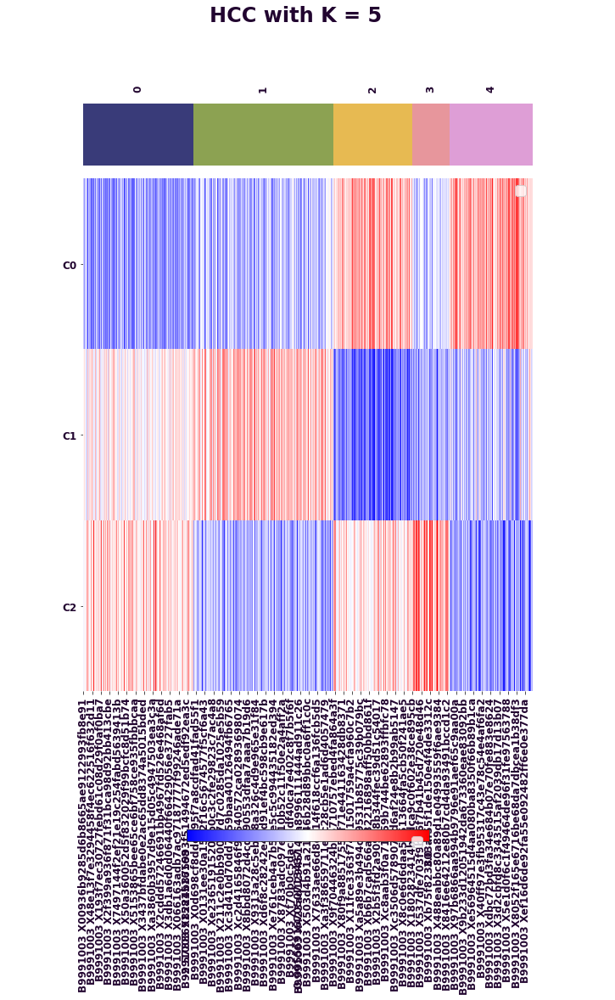

No handles with labels found to put in legend.
No handles with labels found to put in legend.


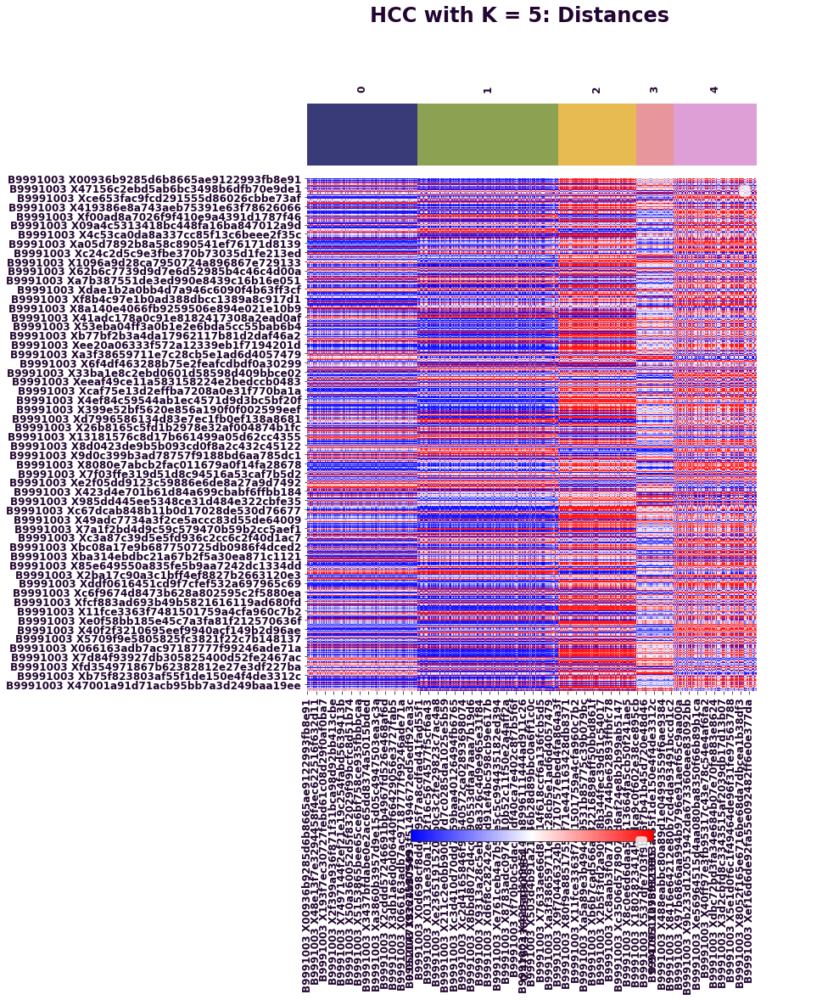

HCC with K = 6 ...
	K = 6: 1/50 ...
	K = 6: 11/50 ...
	K = 6: 21/50 ...
	K = 6: 31/50 ...
	K = 6: 41/50 ...
	K = 6: 50/50 - done.


No handles with labels found to put in legend.
No handles with labels found to put in legend.


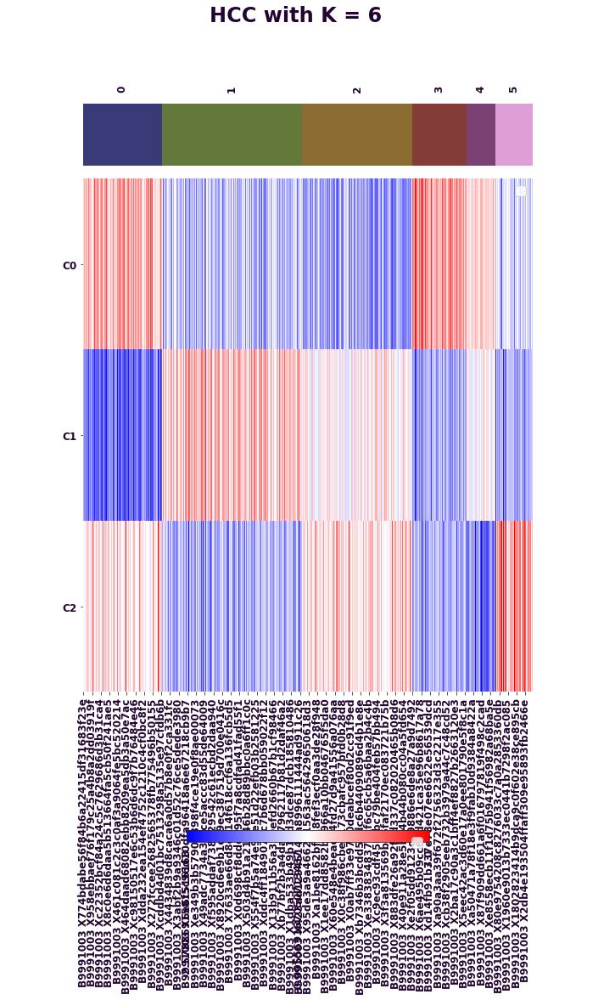

No handles with labels found to put in legend.
No handles with labels found to put in legend.


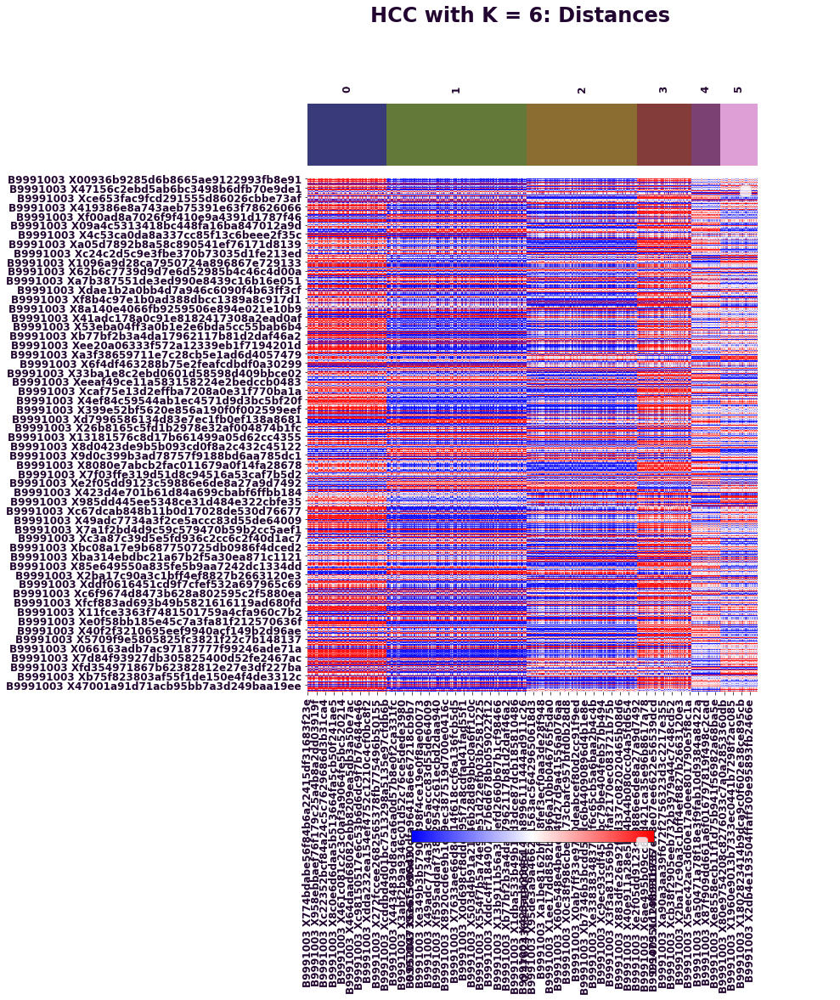

HCC with K = 7 ...
	K = 7: 1/50 ...
	K = 7: 11/50 ...
	K = 7: 21/50 ...
	K = 7: 31/50 ...
	K = 7: 41/50 ...
	K = 7: 50/50 - done.


No handles with labels found to put in legend.
No handles with labels found to put in legend.


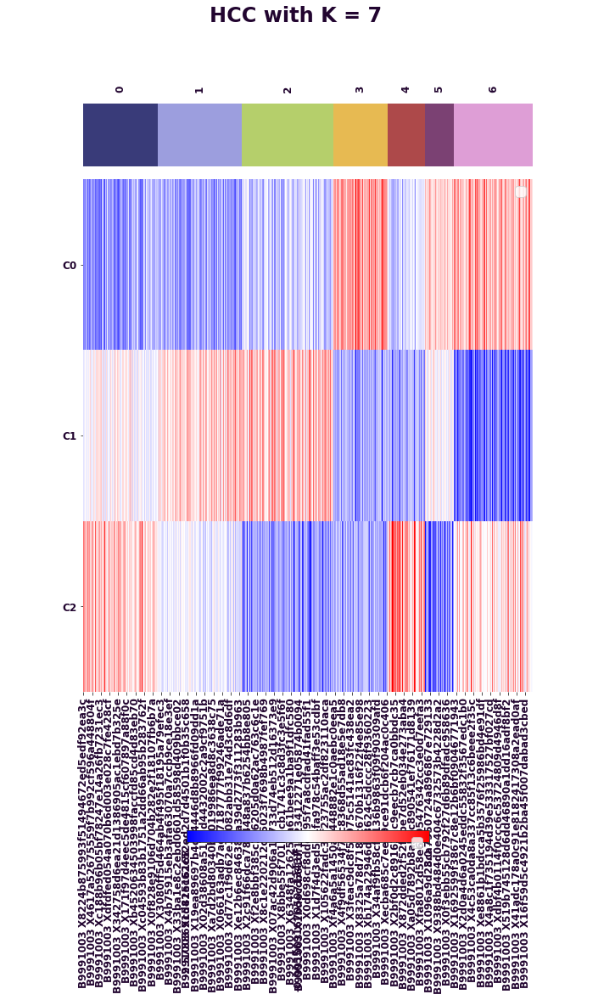

No handles with labels found to put in legend.
No handles with labels found to put in legend.


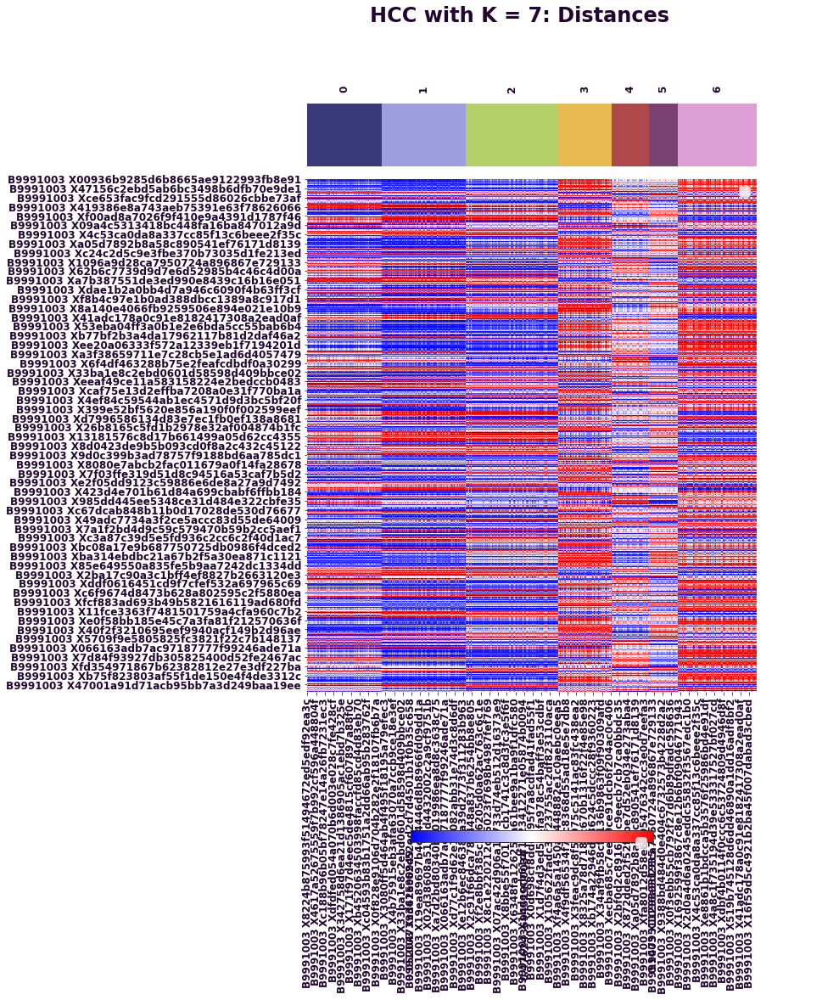

No handles with labels found to put in legend.


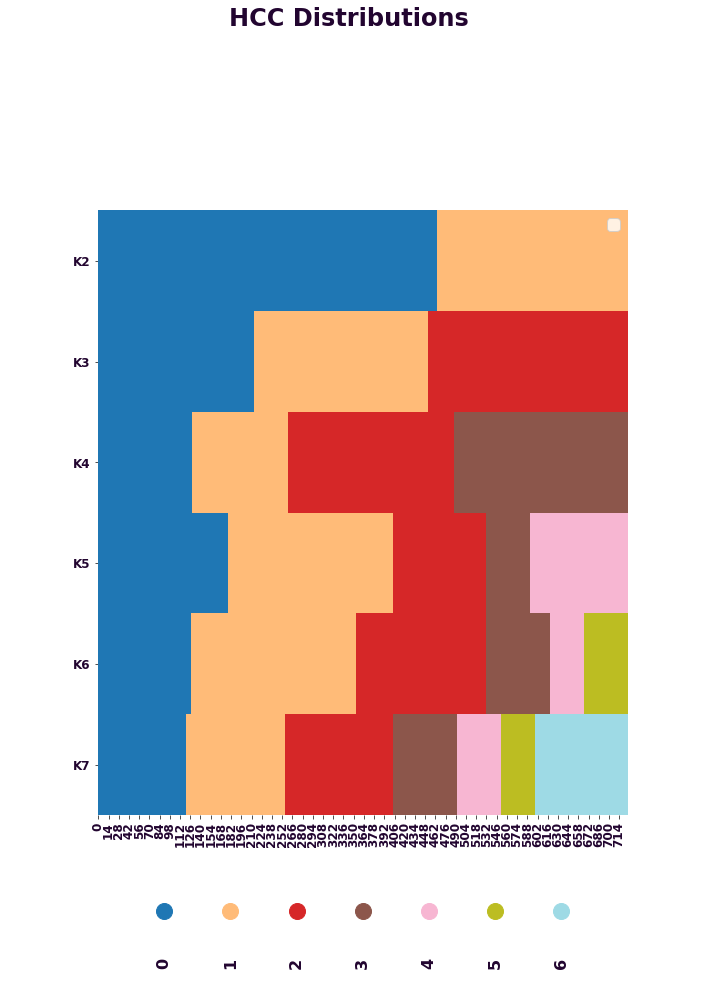

No handles with labels found to put in legend.


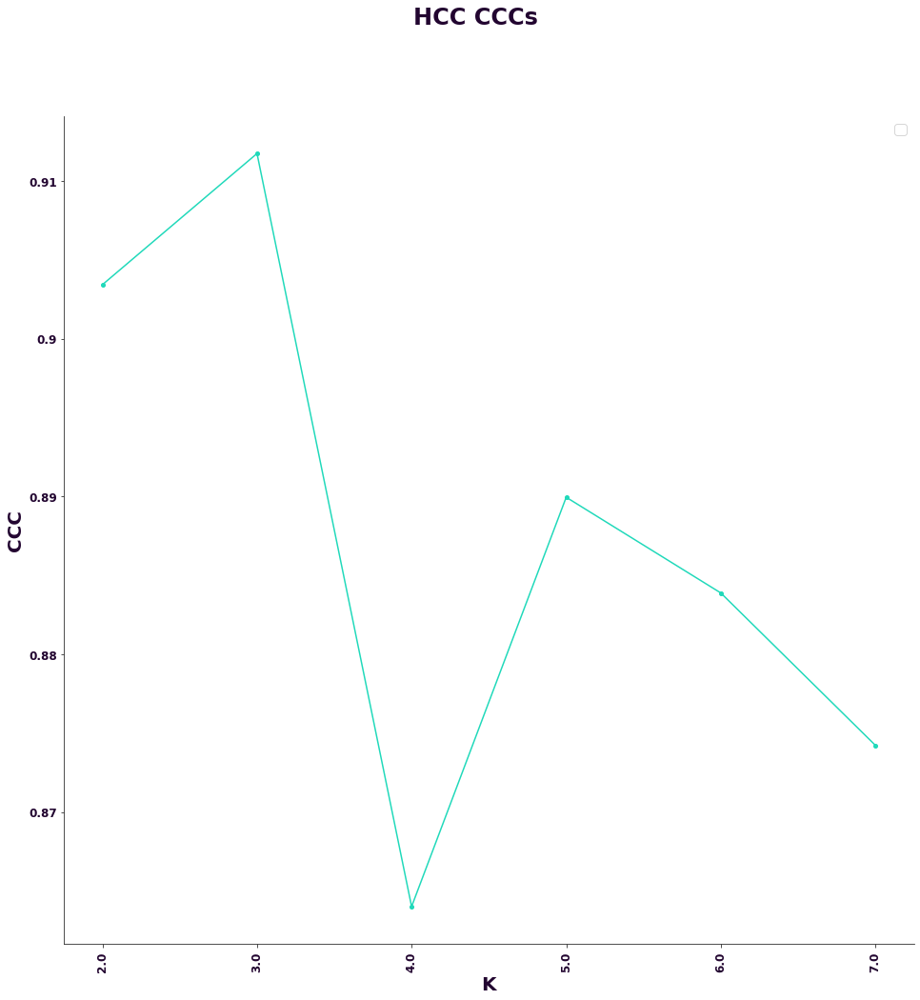

In [11]:
# '-0-' normalize each row
a = ccal.normalize_2d_array(h_matrix.values, '-0-', axis=1)

# Clip values 3 standard deviation away from each row
a = a.clip(min=-3, max=3)

# '0-1' normalize each row
a = ccal.normalize_2d_array(a, '0-1', axis=1)

h_matrix = pd.DataFrame(a, index=h_matrix.index, columns=h_matrix.columns)

ds, hcs, hccs, cccs = ccal.define_states(
     h_matrix,
     range(2, 8),
     '../output/hccs_clinical',
     n_clusterings=50,
     random_seed=12765)

### 7. Rename onocgenic states to match article

In [12]:
hccs = pd.read_table('../output/hccs_clinical/hccs.txt', index_col=0)

sample_states = hccs.loc['K3']

sample_states.name = 'State'

sample_states.index.name = 'Sample'
sample_states.name = 'B9991003 Sample State'

sample_states.to_csv(
    '../output/sample_states.txt', sep='\t', header=True)

# Rename states to match the paper (skip this step since there are only 3 phenotypes here, this is intended for 4 phenotypes)
#sample_states = sample_states.map({2: 0, 3: 1, 0: 2, 1: 3})
sample_states

Sample
B9991003 X00936b9285d6b8665ae9122993fb8e91    1
B9991003 X105622fadc33f23755ac2df823110aca    2
B9991003 Xe44f39747a8e84b02b4cb24659312144    1
B9991003 X293dd1284496215e9a0eca9f17a98e7e    1
B9991003 X01ed7190ce00862696edbf047b542045    2
                                             ..
B9991003 X50772aa64efb859960b20f8801cd6f58    2
B9991003 X91bcd3067a1a7954692d836515e04869    2
B9991003 Xc7439a06ffa32b313b0ec1b987b992a2    0
B9991003 X21a6043653d187f8bbead475d2f49791    2
B9991003 Xa021f5de25a2ffa059870f059a65d075    1
Name: B9991003 Sample State, Length: 726, dtype: int64

### 8. Produce heatmap of B9991003 samples and their membership in each state

No handles with labels found to put in legend.
No handles with labels found to put in legend.


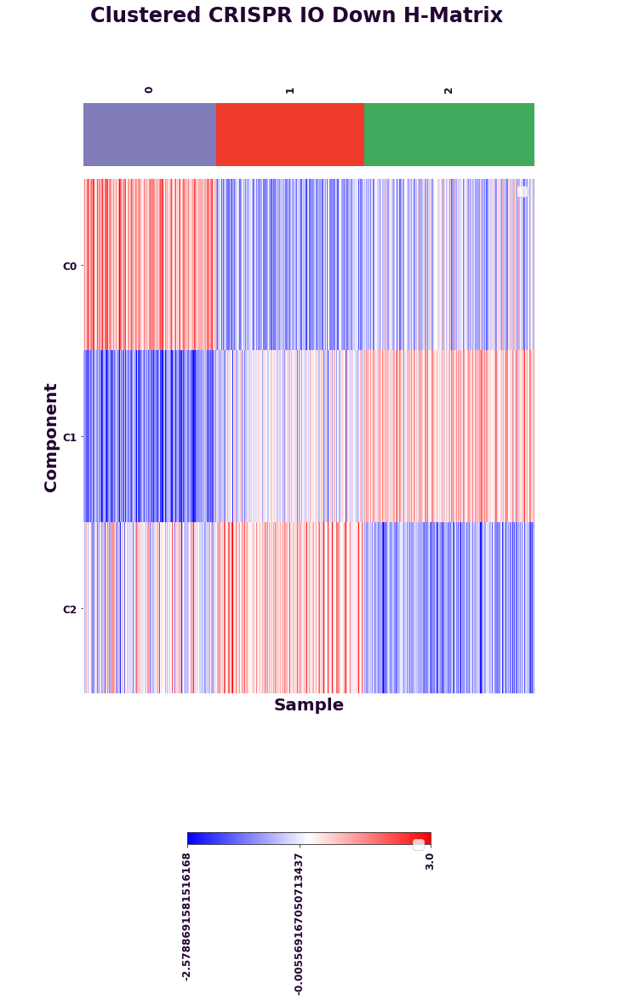

In [13]:
PURPLE = '#807DBA'
BLUE = '#4292C6'
GREEN = '#41AB5D'
RED = '#EF3B2C'

ccal.plot_heatmap(
    h_matrix,
    data_type='continuous',
    normalization_method='-0-',
    normalization_axis=1,
    column_annotation=sample_states,
    annotation_colors=[PURPLE, BLUE, RED, GREEN],
    title='Clustered CRISPR IO Down H-Matrix',
    xlabel='Sample',
    ylabel='Component',
    xticklabels=False)

### 9. Generate the B9991003 Onco-GPS map 

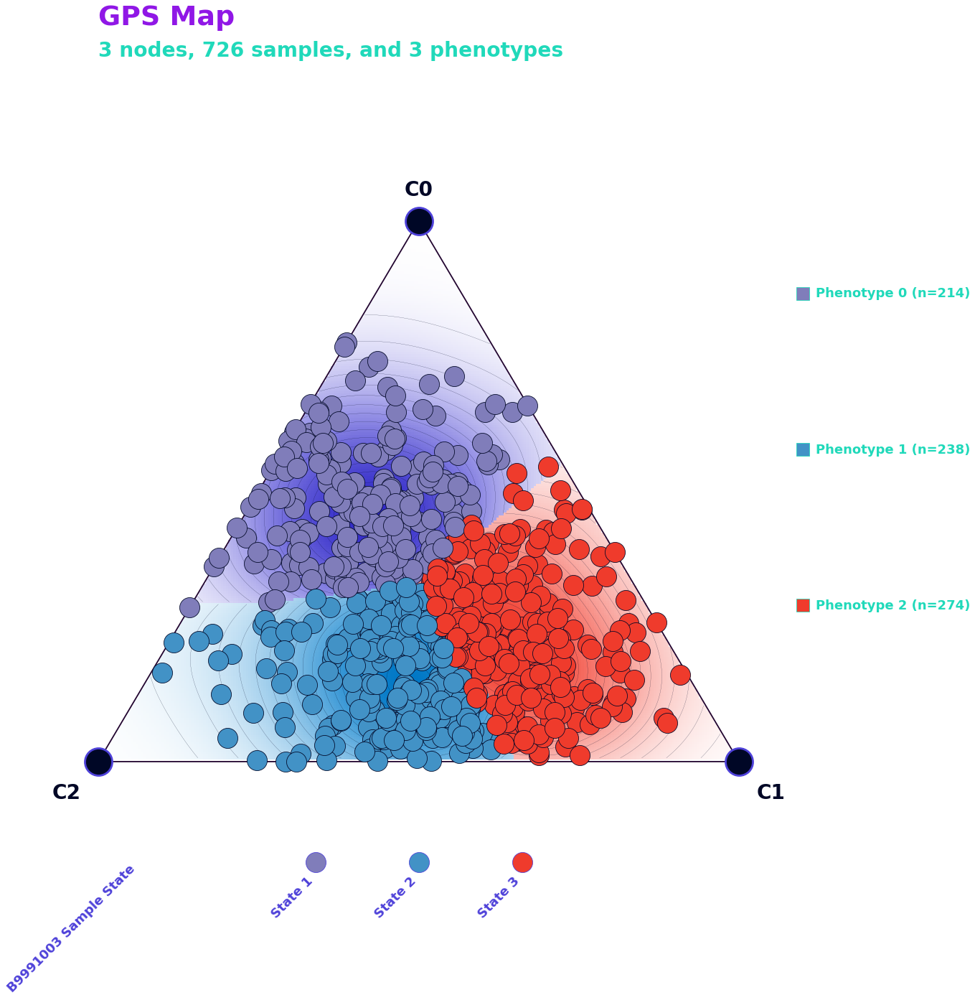

In [14]:
gps_map = ccal.GPSMap(
    h_matrix,
    pull_power=1.2,
    node_x_dimension=pd.DataFrame(
        [[0.5, np.sqrt(3)/2], [1, 0], [0, 0]], index=h_matrix.index))

gps_map.set_sample_phenotypes(
    sample_states,
    phenotype_type='categorical',
    bandwidth_factor=2.8,
    phenotype_color_map=mpl.colors.ListedColormap([PURPLE, BLUE, RED, GREEN]),
    phenotype_to_str={i: 'State {}'.format(i + 1)
                      for i in range(4)})

gps_map.plot_samples_with_phenotype()

# gps_map.save('../output/kras_mutant_gps_map.pickle.gz')

### [Next chapter (6)](6 Annotate cellular states.ipynb)